# Music Genre Classification

## Import Libraries

In [1]:
import tensorflow as tf
print(tf.__version__)
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))

2.19.0
Num GPUs Available: 0


In [2]:
import os
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio
import numpy as np
from tensorflow.image import resize
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras import Input
from tensorflow.keras.utils import plot_model
from IPython.display import Image
import json

## File Visualization

In [3]:
file_name = r'C:\Users\SAMSUNG\OneDrive - Université Mohammed VI Polytechnique\Desktop\Music_ML_Pr\music-ml-app\data\audio\metal\metal.00000.wav'

In [4]:
file_name2 = r'C:\Users\SAMSUNG\OneDrive - Université Mohammed VI Polytechnique/Desktop/Music_ML_Pr/music-ml-app/data/audio/rock/rock.00002.wav'

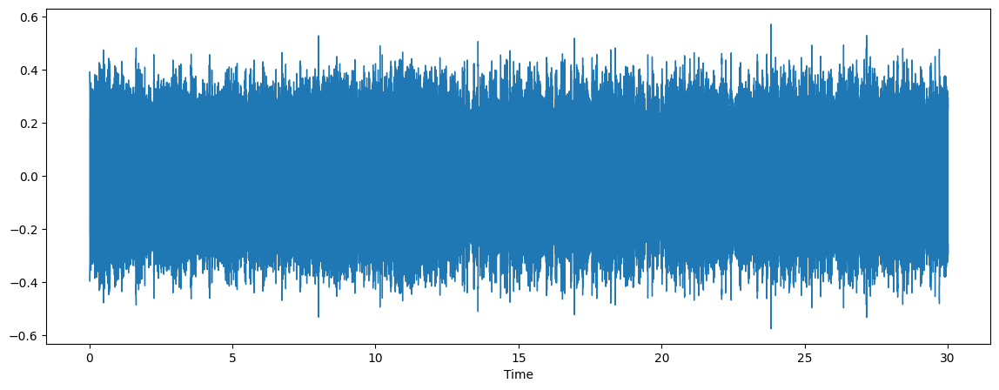

In [5]:
y, sr = librosa.load(file_name, sr=44100)
plt.figure(figsize=(14,5))
librosa.display.waveshow(y, sr=sr)

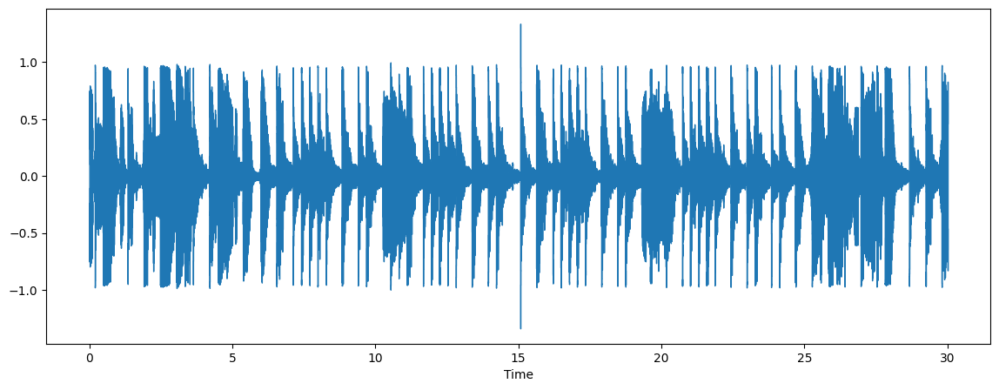

In [6]:
y2, sr = librosa.load(file_name2, sr=44100)
plt.figure(figsize=(14,5))
librosa.display.waveshow(y2, sr=sr)

In [7]:
Audio(data=y, rate=sr)

In [8]:
Audio(data=y2, rate=sr)

## Visualization on Audio Chunk

###  Audio Chunking and Visualization using Librosa


####  **Objective**

This script takes an audio file and splits it into **overlapping chunks** of a specified duration, then visualizes each chunk as a waveform. It uses **Librosa** for audio processing and **Matplotlib** for plotting.


####  **Concept**

* **Chunking**: Dividing a long audio signal into smaller parts (chunks) for easier processing or analysis.
* **Overlap**: Ensuring chunks share some audio data for better context (common in tasks like speech recognition or emotion detection).
* **Visualization**: Plotting waveforms to visually inspect the signal of each chunk.



####  **Code Breakdown**

1. **Load the Audio File**

```python
y, sr = librosa.load(file_name, sr=None)
```

* `file_name`: Path to the input audio file.
* `y`: Loaded audio signal (1D NumPy array).
* `sr`: Sampling rate (samples per second).
* `sr=None`: Preserves the original sample rate of the audio file.



2. **Define Chunk and Overlap Durations (in seconds)**

```python
chunk_duration = 4
overlap_duration = 2
```

* `chunk_duration`: Duration of each audio chunk (e.g., 4 seconds).
* `overlap_duration`: Duration that overlaps between two consecutive chunks (e.g., 2 seconds).



3. **Convert Durations to Number of Samples**

```python
chunk_sample = chunk_duration * sr
overlap_sample = overlap_duration * sr
```

* Converts durations from seconds to samples using the sampling rate.
* Required because audio processing uses sample indices, not time.


4. **Calculate the Number of Chunks**

```python
num_chunks = int(np.ceil((len(y) - chunk_sample) / (chunk_sample - overlap_sample))) + 1
```

* `len(y)`: Total number of samples in the audio.
* `(chunk_sample - overlap_sample)`: Step size for the sliding window.
* `np.ceil(...)`: Ensures all audio is covered, even if the last chunk is shorter.
* `+1`: Includes the first chunk.



5. **Iterate Through Each Chunk and Visualize**

```python
for i in range(num_chunks):
    start = i * (chunk_sample - overlap_sample)
    end = start + chunk_sample
    chunk = y[start:end]
    
    plt.figure(figsize=(4,2))
    librosa.display.waveshow(chunk, sr=sr)
    plt.show()
```

* **Looping** through all chunks:

  * `start` and `end`: Calculate sample indices for each chunk.
  * `chunk = y[start:end]`: Slice the audio array to get the chunk.
* **Plotting**:

  * `plt.figure()`: Creates a new figure.
  * `librosa.display.waveshow(...)`: Plots the waveform of the current chunk.
  * `plt.show()`: Displays the plot.


####  Summary

| Step               | Purpose                              |
| ------------------ | ------------------------------------ |
| Load audio         | Read the signal and sample rate      |
| Set durations      | Define chunk and overlap times       |
| Convert to samples | Work in terms of array indices       |
| Compute chunks     | Calculate how many chunks are needed |
| Loop + plot        | Extract and visualize each chunk     |





### Code

In [9]:
file_name = r'C:\Users\SAMSUNG\OneDrive - Université Mohammed VI Polytechnique\Desktop\Music_ML_Pr\music-ml-app\data\audio\metal\metal.00000.wav'

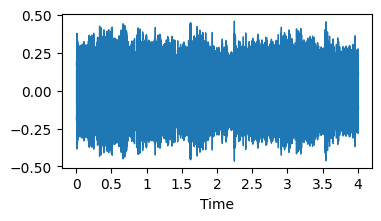

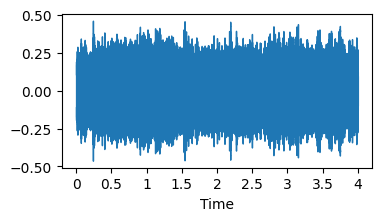

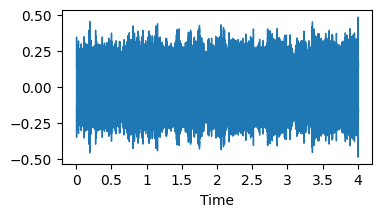

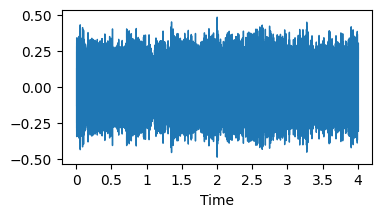

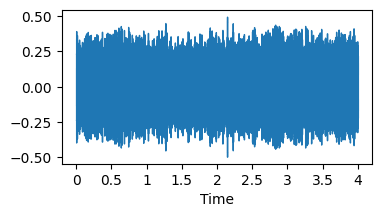

...

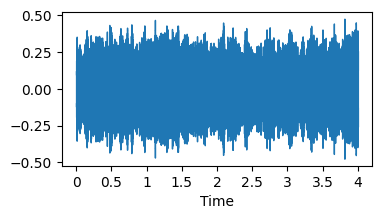

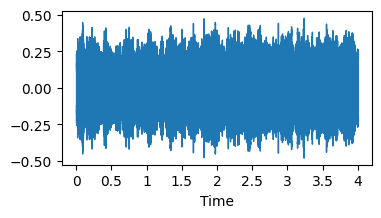

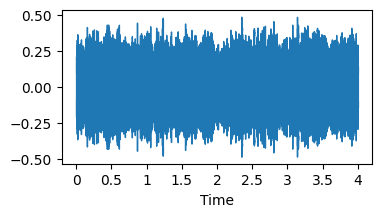

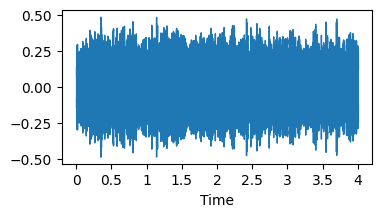

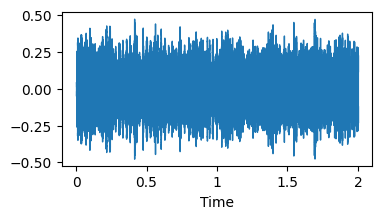

In [10]:
#Load the Audio file
y, sr = librosa.load(file_name, sr=None) # sr=None keeps the original sample rate

#Define the duration of Chunk and overlap
chunk_duration = 4
overlap_duration = 2

#Convert duration to sample
chunk_sample = chunk_duration * sr
overlap_sample = overlap_duration * sr

#Calculate the number of chunks
num_chunks = int(np.ceil((len(y) - chunk_sample) / (chunk_sample - overlap_sample))) +1

#iterate over each chunk
for i in range(num_chunks):
    #calculate start and end indices of the chunk
    start = i*(chunk_sample - overlap_sample)
    end = start + chunk_sample
    #extract chunk audio
    chunk = y[start:end]
    plt.figure(figsize=(4,2))
    librosa.display.waveshow(chunk, sr =sr)
    plt.show()

## Melspectogram Visualization

In [13]:
# Plotting Melspectogram of Entire Audio
def plot_melspec(y, sr):
    #Compute spectogram
    spectogram = librosa.feature.melspectrogram(y=y, sr=sr)
    #Convert to decibles (log scale)
    spectogram_db = librosa.power_to_db(spectogram, ref = np.max)
    #Plot the spectogram
    plt.figure(figsize=(10,4))
    librosa.display.specshow(spectogram_db, sr=sr, x_axis='time', y_axis='mel')
    plt.colorbar(format='%2.0f dB')
    plt.title('Spectogram')
    plt.tight_layout()
    plt.show()

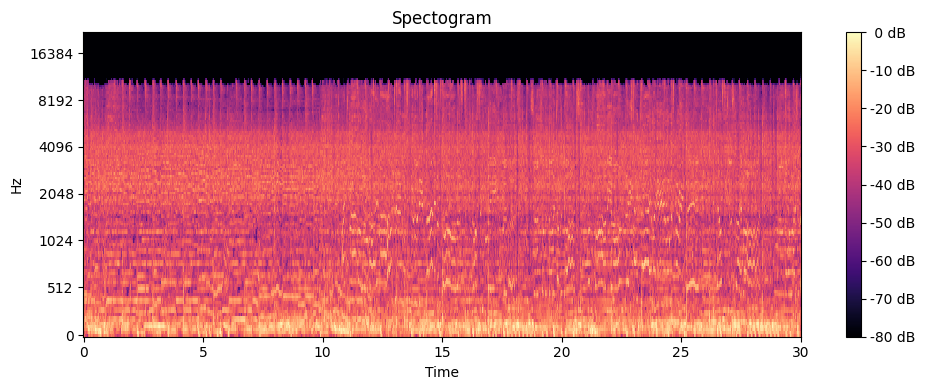

In [14]:
file_name = r'C:\Users\SAMSUNG\OneDrive - Université Mohammed VI Polytechnique\Desktop\Music_ML_Pr\music-ml-app\data\audio\metal\metal.00000.wav'
y, sr = librosa.load(file_name, sr=44100)
plot_melspec(y, sr)

In [19]:
# Plotting Melspectogram for chunks of Audio
def plot_melspectogram_chunks(y, sr):
    #Define the duration of Chunk and overlap
    chunk_duration = 4
    overlap_duration = 2
    
    #Convert duration to sample
    chunk_sample = chunk_duration * sr
    overlap_sample = overlap_duration * sr
    
    #Calculate the number of chunks
    num_chunks = int(np.ceil((len(y) - chunk_sample) / (chunk_sample - overlap_sample))) +1
    
    #iterate over each chunk
    for i in range(num_chunks):
        #calculate start and end indices of the chunk
        start = i*(chunk_sample - overlap_sample)
        end = start + chunk_sample
        #extract chunk audio
        chunk = y[start:end]
        
        #Compute spectogram
        spectogram = librosa.feature.melspectrogram(y=chunk, sr=sr)
        print(spectogram.shape)
        #Convert to decibles (log scale)
        spectogram_db = librosa.power_to_db(spectogram, ref = np.max)
        
        #Plot the spectogram
        plt.figure(figsize=(10,4))
        librosa.display.specshow(spectogram_db, sr=sr, x_axis='time', y_axis='mel')
        plt.colorbar(format='%2.0f dB')
        plt.title('Spectogram')
        plt.tight_layout()
        plt.show()

(128, 345)


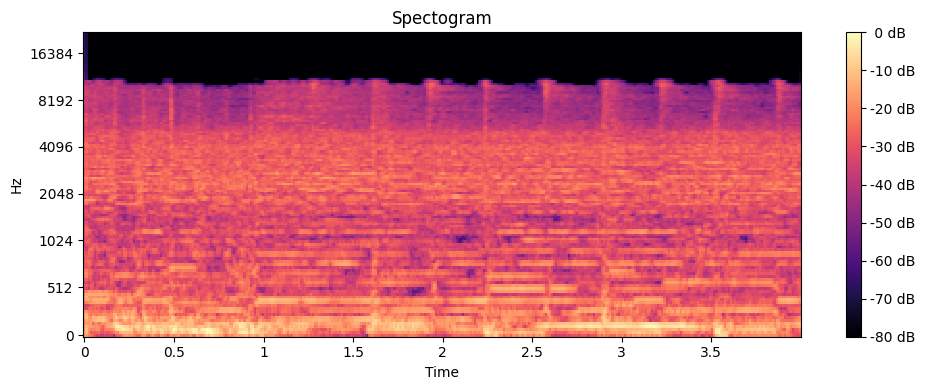

(128, 345)


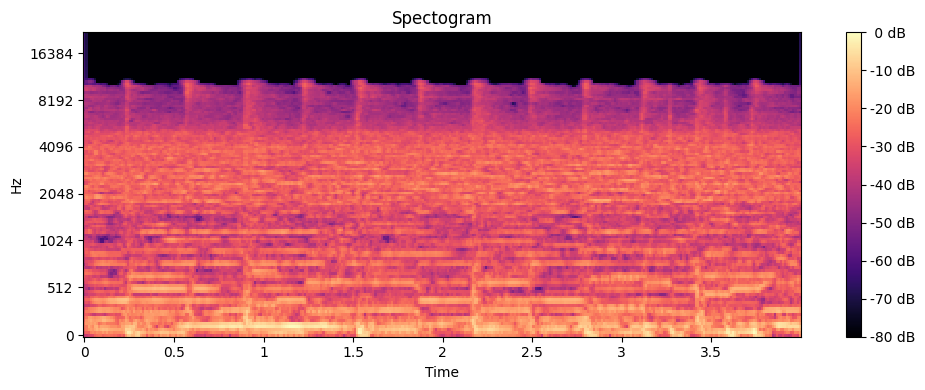

(128, 345)


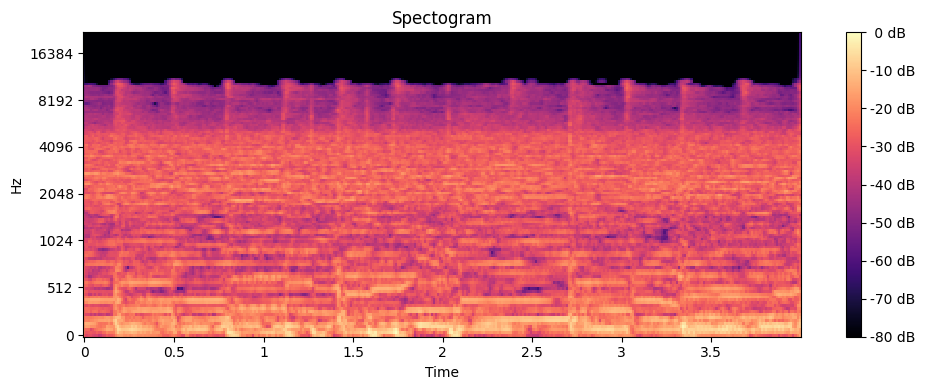

(128, 345)


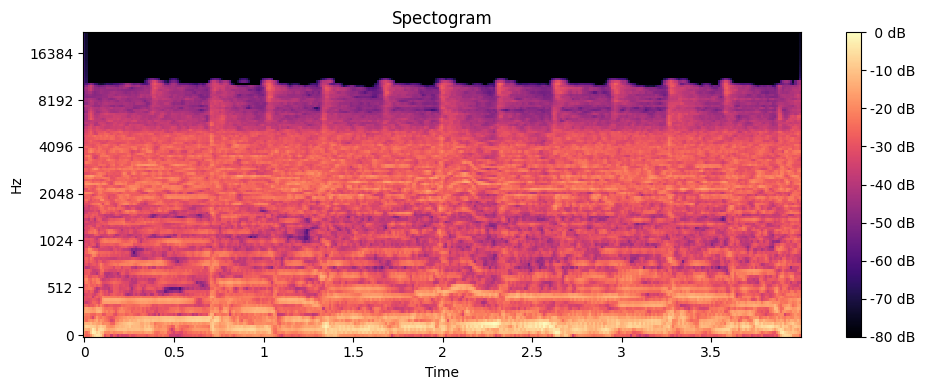

(128, 345)


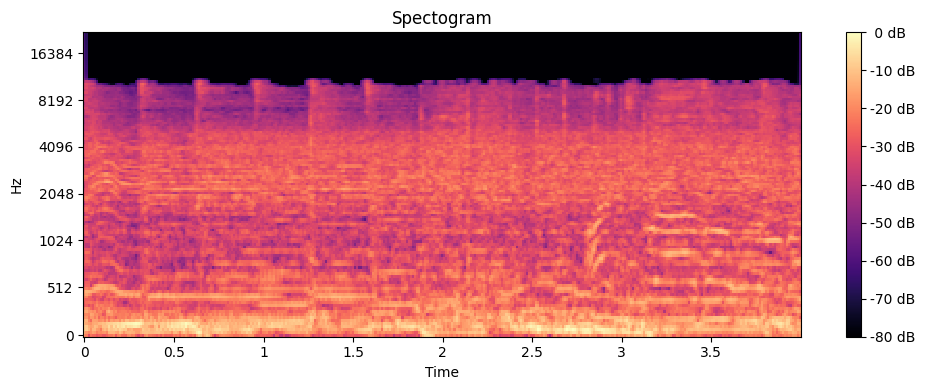

(128, 345)


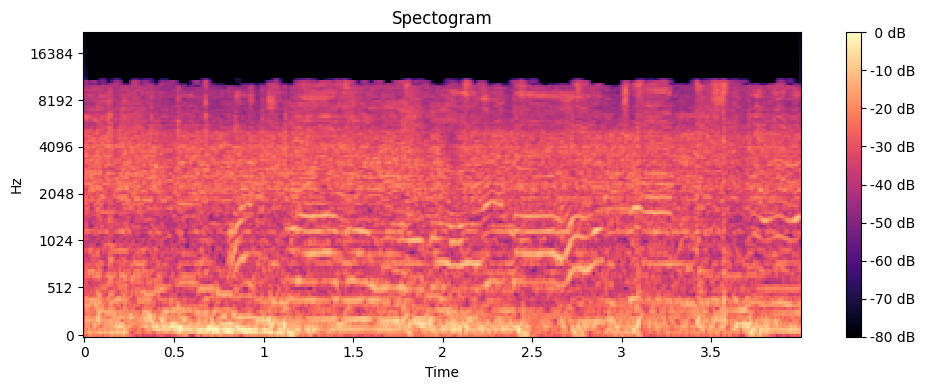

(128, 345)


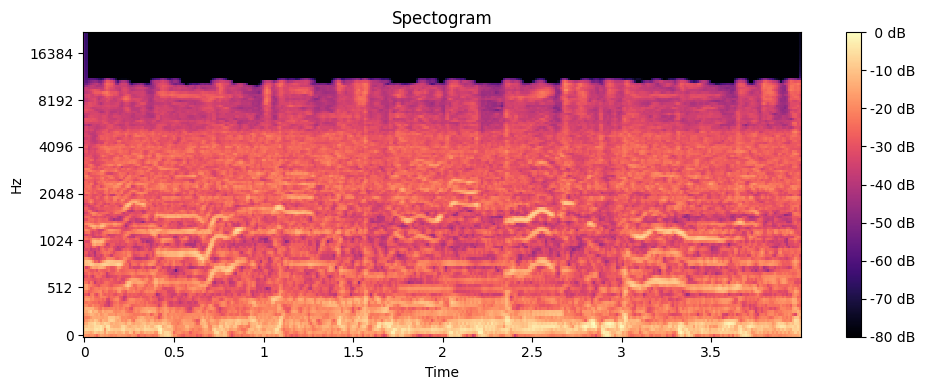

(128, 345)


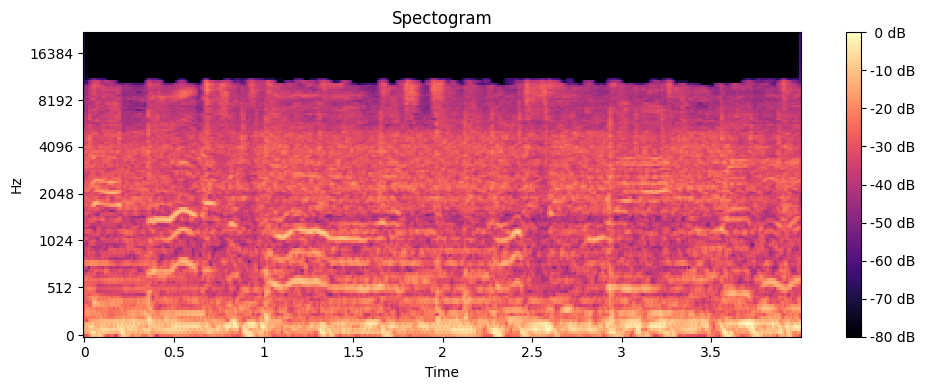

(128, 345)


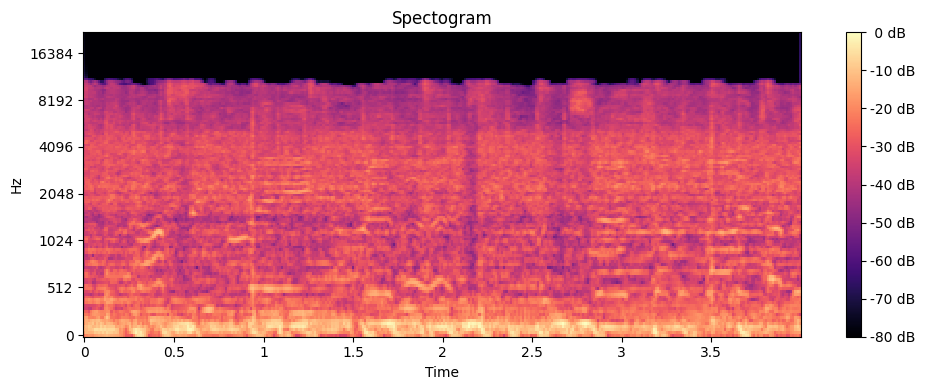

(128, 345)


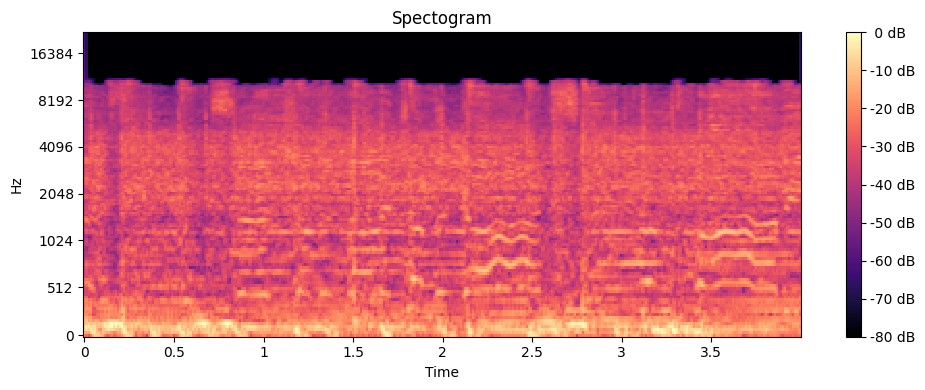

(128, 345)


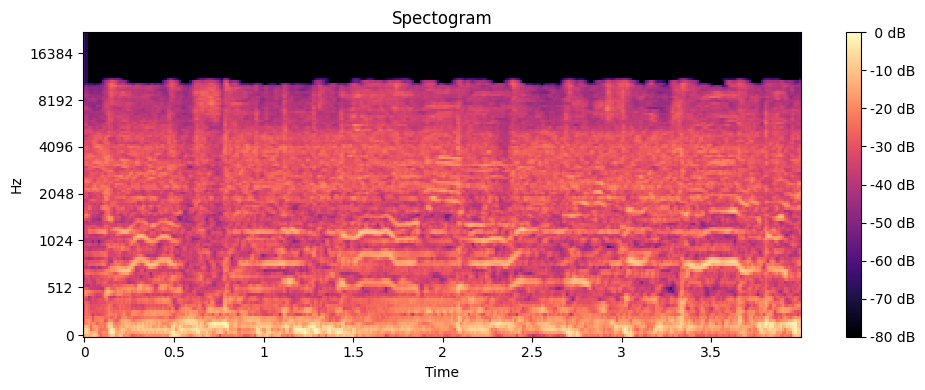

(128, 345)


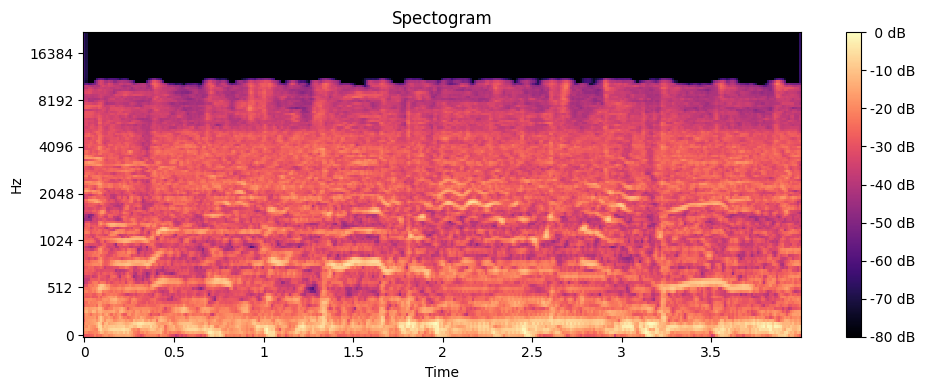

(128, 345)


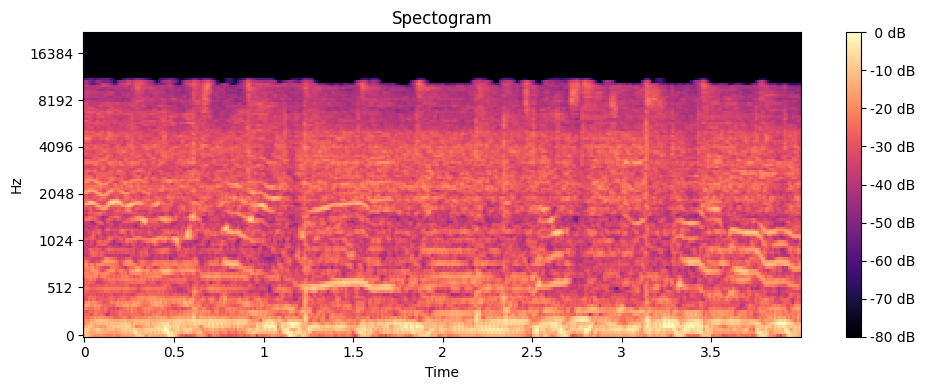

(128, 345)


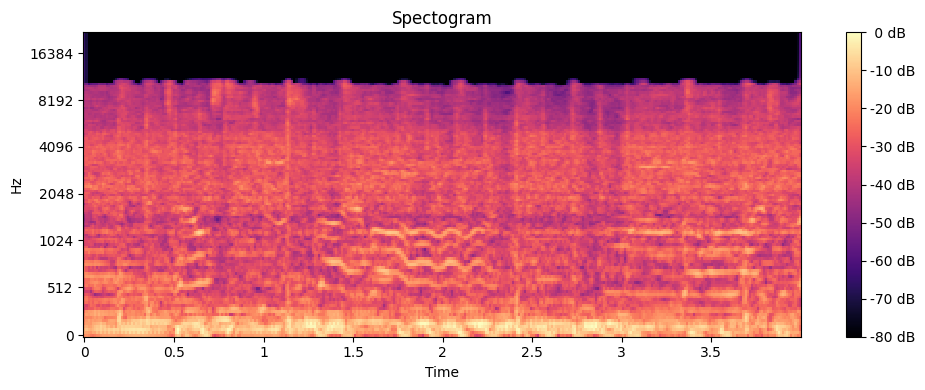

(128, 173)


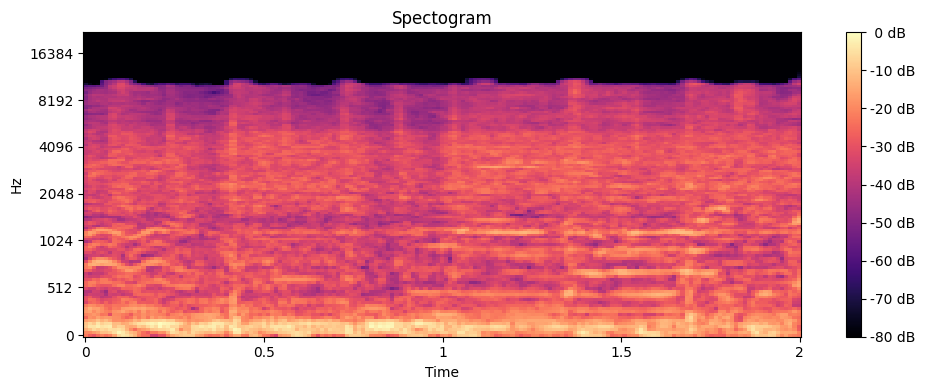

In [20]:
file_name = r'C:\Users\SAMSUNG\OneDrive - Université Mohammed VI Polytechnique\Desktop\Music_ML_Pr\music-ml-app\data\audio\metal\metal.00000.wav'
y, sr = librosa.load(file_name, sr=44100)
plot_melspectogram_chunks(y, sr)

In [21]:
128*345

44160

In [25]:
210*210

44100

## Audio Data Preprocessing

In [3]:
#define folder structure
data_dir = r"C:\Users\SAMSUNG\OneDrive - Université Mohammed VI Polytechnique\Desktop\Music_ML_Pr\music-ml-app\data\audio"


#define the classes (music genres)
classes = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


In [4]:
# Load an Preprocess audio data
def load_and_preprocess_data(data_dir, classes, target_shape=(150, 150)):
    data = []
    labels = []
    for i_class, class_name in enumerate(classes):
        class_dir = os.path.join(data_dir,class_name)
        print("Processing: ", class_name)
        for filename in os.listdir(class_dir):
            if filename.endswith('.wav'):
                file_path = os.path.join(class_dir, filename)
                try:    
                    audio_data, sample_rate = librosa.load(file_path, sr = None) #Keep original sampling rate
                    #Performing Audio Preprocessing
                    #Define the duration of Chunk and overlap
                    chunk_duration = 4
                    overlap_duration = 2
                    
                    #Convert duration to sample
                    chunk_sample = chunk_duration * sample_rate
                    overlap_sample = overlap_duration * sample_rate
                    
                    #Calculate the number of chunks
                    num_chunks = int(np.ceil((len(audio_data) - chunk_sample) / (chunk_sample - overlap_sample))) +1
                    
                    #iterate over each chunk
                    for i in range(num_chunks):
                        #calculate start and end indices of the chunk
                        start = i*(chunk_sample - overlap_sample)
                        end = start + chunk_sample
                        #extract chunk audio
                        chunk = audio_data[start:end]
                        
                        #Compute melspectogram
                        mel_spectogram = librosa.feature.melspectrogram(y=chunk, sr=sample_rate)
                        #Resize matrix based on target_shape
                        mel_spectogram = resize(np.expand_dims(mel_spectogram, axis=-1), target_shape)
                        #Add to data and labels
                        data.append(mel_spectogram)
                        labels.append(i_class)
                except Exception as e:
                    print(f"Skipping {file_path} — {e}")
                    continue
                    
    return np.array(data), np.array(labels)   

In [5]:
data, labels = load_and_preprocess_data(data_dir, classes)

Processing:  blues
Processing:  classical
Processing:  country
Processing:  disco
Processing:  hiphop
Processing:  jazz


C:\Users\SAMSUNG\AppData\Local\Temp\ipykernel_58316\2339903805.py:12: UserWarning: PySoundFile failed. Trying audioread instead.
  audio_data, sample_rate = librosa.load(file_path, sr = None) #Keep original sampling rate
C:\Users\SAMSUNG\anaconda3\envs\Music_ML_Project\Lib\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Skipping C:\Users\SAMSUNG\OneDrive - Université Mohammed VI Polytechnique\Desktop\Music_ML_Pr\music-ml-app\data\audio\jazz\jazz.00054.wav — 
Processing:  metal
Processing:  pop
Processing:  reggae
Processing:  rock


In [6]:
print("The shape of our data features : ", data.shape)
print("The shape of our data labels : ", labels.shape)

The shape of our data features :  (14975, 150, 150, 1)
The shape of our data labels :  (14975,)


In [7]:
labels = to_categorical(labels, num_classes = len(classes)) #Convert labels to One-Hot Encoding

In [8]:
print("The shape of our data labels after one-hot encoding: ", labels.shape)

The shape of our data labels after one-hot encoding:  (14975, 10)


## Splitting Data in Training and Test Set

In [9]:
X_train, X_test, Y_train, Y_test = train_test_split(data, labels, test_size=0.2, random_state=42)

In [10]:
print("Training Feature Data Shape : ", X_train.shape)
print("Test Feature Data Shape : ", X_test.shape)
print("Training Label Data Shape : ", Y_train.shape)
print("Test Label Data Shape : ", Y_test.shape)

Training Feature Data Shape :  (11980, 150, 150, 1)
Test Feature Data Shape :  (2995, 150, 150, 1)
Training Label Data Shape :  (11980, 10)
Test Label Data Shape :  (2995, 10)


## Build and Train Deep Learning Model

In [22]:
model = Sequential()

model.add(Input(shape=X_train[0].shape))

model.add(Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'))
model.add(Conv2D(filters=32, kernel_size=3, activation='relu'))
model.add(MaxPool2D(pool_size=2, strides=2))

model.add(Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'))
model.add(Conv2D(filters=64, kernel_size=3, activation='relu'))
model.add(MaxPool2D(pool_size=2, strides=2))



model.add(Conv2D(filters=128, kernel_size=3, padding='same', activation='relu'))
model.add(Conv2D(filters=128, kernel_size=3, activation='relu'))
model.add(MaxPool2D(pool_size=2, strides=2))


model.add(Dropout(0.3))


model.add(Conv2D(filters=256, kernel_size=3, padding='same', activation='relu'))
model.add(Conv2D(filters=256, kernel_size=3, activation='relu'))
model.add(MaxPool2D(pool_size=2, strides=2))

model.add(Conv2D(filters=512, kernel_size=3, padding='same', activation='relu'))
model.add(Conv2D(filters=512, kernel_size=3, activation='relu'))
model.add(MaxPool2D(pool_size=2, strides=2))


model.add(Dropout(0.3))

model.add(Flatten())

model.add(Dense(units=1200, activation='relu'))

model.add(Dropout(0.45))

#Output Layer
model.add(Dense(units=len(classes), activation='softmax'))

In [23]:
#This is to ouput the Model Architecture
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)              │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 148, 148, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 74, 74, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 72, 72, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 36, 36, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 34, 34, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 17, 17, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 15, 15, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 7, 7, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 5, 5, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1200)           │     2,458,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 1200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │        12,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,182,458 (27.40 MB)

 Trainable params: 7,182,458 (27.40 MB)

 Non-trainable params: 0 (0.00 B)

In [24]:
#Compile The model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [25]:
#Training The Model
training_history = model.fit(X_train, Y_train, epochs=30, batch_size=32, validation_data=(X_test, Y_test))

Epoch 1/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 341s 905ms/step - accuracy: 0.2684 - loss: 1.9834 - val_accuracy: 0.4257 - val_loss: 1.6347
Epoch 2/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 438s 1s/step - accuracy: 0.5025 - loss: 1.4085 - val_accuracy: 0.6067 - val_loss: 1.1694
Epoch 3/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 409s 1s/step - accuracy: 0.6073 - loss: 1.1295 - val_accuracy: 0.6614 - val_loss: 1.0086
Epoch 4/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 423s 1s/step - accuracy: 0.6716 - loss: 0.9601 - val_accuracy: 0.6845 - val_loss: 0.9434
Epoch 5/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 404s 1s/step - accuracy: 0.7120 - loss: 0.8349 - val_accuracy: 0.7352 - val_loss: 0.7828
Epoch 6/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 607s 2s/step - accuracy: 0.7597 - loss: 0.7067 - val_accuracy: 0.7519 - val_loss: 0.7377
Epoch 7/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 330s 879ms/step - accuracy: 0.7929 - loss: 0.6106 - val_accuracy: 0.7566 - val_loss: 0.7184
Epoch 8/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 397s 1s/step - accuracy: 0.8306 - loss: 0.5038 - va

In [27]:
model.save("Trained_mode.keras")
model.save("Trained_mode.h5")

In [28]:
training_history.history

{'accuracy': [0.26836395263671875,
  0.5025041699409485,
  0.6072620749473572,
  0.6716193556785583,
  0.7120200395584106,
  0.759682834148407,
  0.7929048538208008,
  0.8306344151496887,
  0.849081814289093,
  0.868948221206665,
  0.8957428932189941,
  0.9064273834228516,
  0.9169449210166931,
  0.9284641146659851,
  0.942737877368927,
  0.9397329092025757,
  0.9522537589073181,
  0.9543405771255493,
  0.9584307074546814,
  0.9675292372703552,
  0.9725375771522522,
  0.9697829484939575,
  0.9748747944831848,
  0.9726210236549377,
  0.9778798222541809,
  0.9796327352523804,
  0.9771285653114319,
  0.9785475730895996,
  0.9787145256996155,
  0.9833055138587952],
 'loss': [1.9833608865737915,
  1.4085028171539307,
  1.1295080184936523,
  0.960111677646637,
  0.8348629474639893,
  0.7066609263420105,
  0.6105538606643677,
  0.5037763118743896,
  0.44925644993782043,
  0.37966540455818176,
  0.3104507327079773,
  0.27483728528022766,
  0.2459523230791092,
  0.20857781171798706,
  0.1745571

In [30]:
with open('training_hist.json','w') as f:
    json.dump(training_history.history, f) 

## Loading and Evaluating Deep Learning Model 

In [11]:
#Loading Model variable
model_path = r"C:\Users\SAMSUNG\OneDrive - Université Mohammed VI Polytechnique\Desktop\Music_ML_Pr\music-ml-app\models\Trained_model_Music_Genre_Class.h5"

model = tf.keras.models.load_model(model_path)

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)              │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 148, 148, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 74, 74, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 72, 72, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 36, 36, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 34, 34, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 17, 17, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 15, 15, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 7, 7, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 5, 5, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1200)           │     2,458,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 1200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │        12,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,182,460 (27.40 MB)

 Trainable params: 7,182,458 (27.40 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [12]:
#Loading Model Training History
history_path = r"C:\Users\SAMSUNG\OneDrive - Université Mohammed VI Polytechnique\Desktop\Music_ML_Pr\music-ml-app\models\training_hist_Music_Genre_Class.json"

with open(history_path, 'r') as json_file:
    training_history = json.load(json_file)
    
training_history.keys()


dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [14]:
#Model Evaluation on Training set
training_loss, training_accuracy = model.evaluate(X_train,Y_train)

#Model Evaluation on Validation set
validation_loss, validation_accuracy = model.evaluate(X_test,Y_test)

375/375 ━━━━━━━━━━━━━━━━━━━━ 74s 195ms/step - accuracy: 0.9859 - loss: 0.0429
94/94 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8962 - loss: 0.3932


In [15]:
print("The Training Loss is : ",training_loss)
print("The Training Accuracy is : ",training_accuracy)

print("The Validation Loss is : ",validation_loss)
print("The Validation Acuuracy is : ",validation_accuracy)

The Training Loss is :  0.04288217052817345
The Training Accuracy is :  0.9858931303024292
The Validation Loss is :  0.3931651711463928
The Validation Acuuracy is :  0.8961602449417114


## Accuracy/Loss Vizualization

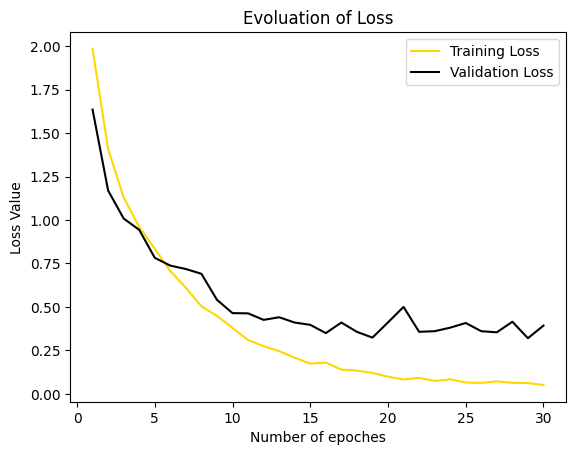

In [18]:
#Vizualization of Loss
epoches = [i for i in range(1,31)]

plt.plot(epoches, training_history['loss'], label='Training Loss', color='gold')
plt.plot(epoches, training_history['val_loss'], label='Validation Loss', color='black')

plt.legend()

plt.xlabel('Number of epoches')
plt.ylabel('Loss Value')

plt.title('Evoluation of Loss')
plt.show()

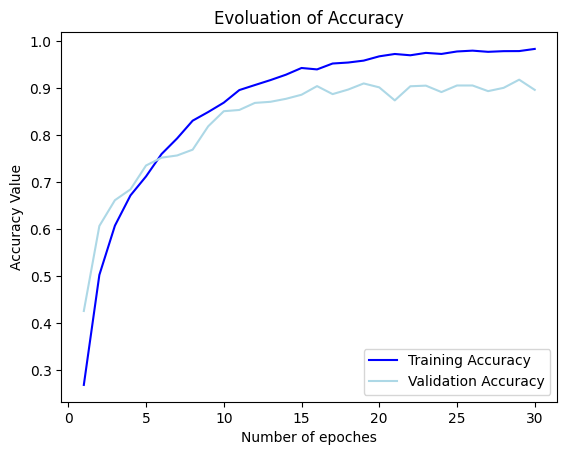

In [19]:
#Vizualization of Accuracy
epoches = [i for i in range(1,31)]

plt.plot(epoches, training_history['accuracy'], label='Training Accuracy', color='blue')
plt.plot(epoches, training_history['val_accuracy'], label='Validation Accuracy', color='lightblue')

plt.legend()

plt.xlabel('Number of epoches')
plt.ylabel('Accuracy Value')

plt.title('Evoluation of Accuracy')
plt.show()